In [ ]:
!pip install -q kaggle

In [ ]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

 97% 696M/714M [00:25<00:00, 25.7MB/s]
100% 714M/714M [00:25<00:00, 29.7MB/s]


In [ ]:
!mkdir brain

In [ ]:
! unzip lgg-mri-segmentation.zip -d brain

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_9_mask.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_1.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10_mask.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11_mask.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12_mask.tif  
  inflating: brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_199103

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

import tensorflow as tf
import tensorflow.keras.layers as tfl

In [ ]:
df_data = pd.read_csv("brain/lgg-mri-segmentation/kaggle_3m/data.csv")

In [ ]:
df_data

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,NaN,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,NaN,5.0,2,1.0,NaN,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,NaN,5.0,2,NaN,NaN,NaN,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


In [ ]:
dir_path = "brain/lgg-mri-segmentation/kaggle_3m/"

In [ ]:
import os 

pat_dirs = os.listdir(dir_path)
pat_dirs.remove("data.csv")
pat_dirs.remove("README.md")

pat_dirs

['TCGA_DU_5854_19951104',
 'TCGA_DU_6401_19831001',
 'TCGA_HT_7686_19950629',
 'TCGA_FG_7643_20021104',
 'TCGA_CS_4942_19970222',
 'TCGA_DU_5871_19941206',
 'TCGA_CS_5393_19990606',
 'TCGA_HT_7879_19981009',
 'TCGA_DU_A5TU_19980312',
 'TCGA_FG_5962_20000626',
 'TCGA_DU_8163_19961119',
 'TCGA_CS_6186_20000601',
 'TCGA_DU_7013_19860523',
 'TCGA_CS_4944_20010208',
 'TCGA_DU_A5TR_19970726',
 'TCGA_CS_4941_19960909',
 'TCGA_DU_A5TY_19970709',
 'TCGA_FG_8189_20030516',
 'TCGA_FG_A4MU_20030903',
 'TCGA_HT_7605_19950916',
 'TCGA_DU_7014_19860618',
 'TCGA_HT_7855_19951020',
 'TCGA_HT_7882_19970125',
 'TCGA_DU_7301_19911112',
 'TCGA_HT_7602_19951103',
 'TCGA_DU_7299_19910417',
 'TCGA_HT_7616_19940813',
 'TCGA_DU_7302_19911203',
 'TCGA_HT_7684_19950816',
 'TCGA_HT_8563_19981209',
 'TCGA_DU_6408_19860521',
 'TCGA_HT_8113_19930809',
 'TCGA_FG_5964_20010511',
 'TCGA_HT_7874_19950902',
 'TCGA_DU_8168_19970503',
 'TCGA_HT_7690_19960312',
 'TCGA_CS_6667_20011105',
 'TCGA_DU_8165_19970205',
 'TCGA_CS_62

In [ ]:
pat_info_df = pd.DataFrame(columns=["patient_id", "patient_dir"])

for pat in pat_dirs:

  pat_dir_ = dir_path + pat + "/"
  pat_df_ = pd.DataFrame(np.array([[pat, pat_dir_]]), columns = ["patient_id", "patient_dir"])
  pat_info_df = pd.concat([pat_info_df, pat_df_])


pat_info_df = pat_info_df.reset_index()


In [ ]:
pat_info_df.drop(["index"], axis = 1, inplace = True)

In [ ]:
df = pd.DataFrame(columns = ["patient_id","path", "mask"])


for id, path in pat_info_df.values:

  files = os.listdir(path)

  for f in files:
    if "mask" in f:
      array_info = np.array([id, path + f, 1])
      df_info = pd.DataFrame([array_info], columns = ["patient_id","path", "mask"])
      df = pd.concat([df, df_info])
    else:
      array_info = np.array([id, path + f, 0])
      df_info = pd.DataFrame([array_info], columns = ["patient_id","path", "mask"])
      df = pd.concat([df, df_info])


In [ ]:
df = df.reset_index()
df.drop(["index"], axis = 1, inplace = True)

In [ ]:
df["patient_id"].nunique()

110

In [ ]:
# everything seems correct until now.

In [ ]:
df = df1.copy()

In [ ]:
img0 = mpimg.imread(df["path"][0])

In [ ]:
pat0_df = df[df["patient_id"] == pat_info_df["patient_id"][0]]

pat0_imgs = pat0_df[pat0_df["mask"] == 0]
pat0_masks = pat0_df[pat0_df["mask"] == 1]

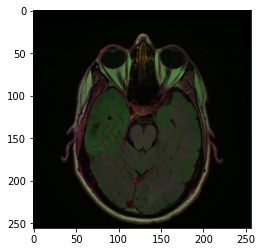

In [ ]:
for img_file in pat0_imgs["path"]:
  img_ = cv2.imread(img_file)
  plt.imshow(img_)

In [ ]:
df

,patient_id,path,mask
0,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
1,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
2,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
3,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
4,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,1
...,...,...,...
7853,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0
7854,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0
7855,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0
7856,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0


In [ ]:
df[df["path"].str.contains(df["path"][0][:-4])]

,patient_id,path,mask
0,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
31,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,1


In [ ]:
# Apparently, every image has its own mask.

In [ ]:
df_imgs = df[df["mask"] == "0"]

In [ ]:
df_imgs_paths = df_imgs["path"]

In [ ]:
df_imgs_ns = df_imgs_paths.map(lambda x : x[:-4])

In [ ]:
df_imgs_paths[0]

'brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7855_19951020/TCGA_HT_7855_19951020_16.tif'

In [ ]:
df_imgs_ns[0]

'brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7855_19951020/TCGA_HT_7855_19951020_16'

In [ ]:
df = df1.copy()

In [ ]:
df2 = pd.DataFrame(columns = ["patient_id", "img_path", "mask_path", "mask"])

for name in df_imgs_ns:

  mask_opt = name + "_"
  img_opt = name + ".tif"


  mask_pd = df[df["path"].str.contains(mask_opt)]
  img_pd = df[df["path"].str.contains(img_opt)]

  pat_id_ = mask_pd["patient_id"].values
  mask_path = mask_pd["path"].values
  img_path = img_pd["path"].values

  array_info = np.array([pat_id_, img_path, mask_path])
  
  print(array_info)

  array_info = np.reshape(array_info, (1,3))
  array_df = pd.DataFrame(array_info, columns = ["patient_id", "img_path", "mask_path"])

  df2 = pd.concat([df2, array_df])

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_6.tif']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_6_mask.tif']]
[['TCGA_CS_4941_19960909']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_3.tif']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_3_mask.tif']]
[['TCGA_CS_4941_19960909']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_11.tif']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_11_mask.tif']]
[['TCGA_CS_4941_19960909']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_10.tif']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_10_mask.tif']]
[['TCGA_CS_4941_19960909']
 ['brain/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909

In [ ]:
df2 = df2.reset_index()
df2.drop(["index"], axis = 1, inplace = True)

In [ ]:
df2

,patient_id,img_path,mask_path
0,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
1,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
2,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
3,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
4,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
...,...,...,...
3924,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3925,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3926,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3927,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...


In [ ]:
# I spent my 1 hour to export the data and to create meaningful dataframes. I will save these and continue later.

In [ ]:
df.to_csv("df1.csv")

In [ ]:
df2.to_csv("df2.csv")

In [ ]:
df1 = pd.read_csv("df1.csv")

In [ ]:
df2 = pd.read_csv("df2.csv")

In [ ]:
df1

,Unnamed: 0,patient_id,path,mask
0,0,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
1,1,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
2,2,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
3,3,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,0
4,4,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,1
...,...,...,...,...
7853,7853,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0
7854,7854,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0
7855,7855,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0
7856,7856,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,0


In [ ]:
df2

,Unnamed: 0,patient_id,img_path,mask_path
0,0,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
1,1,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
2,2,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
3,3,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
4,4,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
...,...,...,...,...
3924,3924,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3925,3925,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3926,3926,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3927,3927,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...


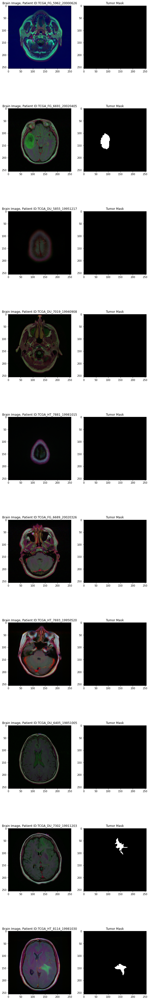

In [ ]:
import random
random_img = random.sample(list(df2["img_path"]), 10)

n = 1
plt.figure(figsize = (10, 75))

for im in random_img:

  pat_id = df2[df2["img_path"] == im]["patient_id"].values[0]
  mask_img = df2[df2["img_path"] == im]["mask_path"].values[0]

  img = cv2.imread(im)
  mask = cv2.imread(mask_img)

  plt.subplot(10, 2, n)
  plt.imshow(img)
  plt.title("Brain Image, Patient ID:{}".format(pat_id))

  plt.subplot(10, 2, n+1)
  plt.imshow(mask)
  plt.title("Tumor Mask")

  n += 2
  

  

In [ ]:
df2

,Unnamed: 0,patient_id,img_path,mask_path
0,0,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
1,1,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
2,2,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
3,3,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
4,4,TCGA_HT_7855_19951020,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_HT_7...
...,...,...,...,...
3924,3924,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3925,3925,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3926,3926,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...
3927,3927,TCGA_FG_A60K_20040224,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...,brain/lgg-mri-segmentation/kaggle_3m/TCGA_FG_A...


In [ ]:
train_df = df2.drop(["Unnamed: 0", "patient_id"], axis = 1)

In [ ]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(train_df, test_size = 0.10)

In [ ]:
def conv_block(inputs = None, n_filters = 32, dropout_prob = 0, max_pooling = True):

  conv = tfl.Conv2D(filters = n_filters,
                    kernel_size = 3,
                    activation = "relu",
                    padding = "same",
                    kernel_initializer = "he_normal")(inputs)
  
  conv = tfl.Conv2D(filters = n_filters,
                    kernel_size = 3,
                    activation = "relu",
                    padding = "same",
                    kernel_initializer = "he_normal")(conv)

  
  if dropout_prob > 0:
    conv = tfl.Dropout(dropout_prob)(conv)

  if max_pooling:
    next_layer = tfl.MaxPooling2D(2)(conv)
  else:
    next_layer = conv

  skip_connection = conv

  return next_layer, skip_connection

In [ ]:
def upsample_block(prev_layer_input, skip_con_input, n_filters = 32):

  up = tfl.Conv2DTranspose(filters = n_filters,
                           kernel_size = 3,
                           strides = 2,
                           padding = "same")(prev_layer_input)

  merged =  tfl.concatenate([up, skip_con_input], axis = 3)

  conv = tfl.Conv2D(filters = n_filters,
                    kernel_size = 3,
                    activation = "relu",
                    padding = "same",
                    kernel_initializer = "he_normal")(merged)

  conv = tfl.Conv2D(filters = n_filters,
                    kernel_size = 3,
                    activation = "relu",
                    padding = "same",
                    kernel_initializer = "he_normal")(conv)

  return conv 


In [ ]:
def unet_model(input_size = (256,256,3), n_filters = 32):

  inputs = tfl.Input(input_size)


  conv_block_1 = conv_block(inputs,
                            n_filters)
  
  conv_block_2 = conv_block(conv_block_1[0],
                            n_filters * 2)
  
  conv_block_3 = conv_block(conv_block_2[0],
                            n_filters * 4)
  
  conv_block_4 = conv_block(conv_block_3[0],
                            n_filters * 8,
                            dropout_prob = 0.3)

  conv_block_5 = conv_block(conv_block_4[0],
                            n_filters * 16,
                            dropout_prob = 0.3,
                            max_pooling = False)
  
  up_block_4 = upsample_block(conv_block_5[0],
                              conv_block_4[1],
                              n_filters * 8)
   
  up_block_3 = upsample_block(up_block_4,
                              conv_block_3[1],
                              n_filters * 4) 
  
  up_block_2 = upsample_block(up_block_3,
                              conv_block_2[1],
                              n_filters * 2)
  
  up_block_1 = upsample_block(up_block_2,
                              conv_block_1[1],
                              n_filters )
  
  conv10 = tfl.Conv2D(n_filters,
                     3,
                     activation = "relu",
                     padding = "same",
                     kernel_initializer = "he_normal")(up_block_1)

  conv11 = tfl.Conv2D(filters = 2,
                      kernel_size = 1,
                      padding = "same")(conv10)

  model = tf.keras.Model(inputs = inputs, outputs = conv11)

  return model

In [ ]:
img_height = 96
img_width = 128
num_channels = 3

unet1 = unet_model((img_height, img_width, num_channels))

In [ ]:
unet1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 96, 128, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 96, 128, 32)  896         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 96, 128, 32)  9248        ['conv2d[0][0]']                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 48, 64, 32)   0           ['conv2d_1[0][0]']           

In [ ]:
unet1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [ ]:
### I will convert it to jpg and try again. It did not go so well with .tif files.

In [ ]:
import cv2 
base_path = "brain/kaggle_3m/"
new_path = "brain_jpg/"
for infile in os.listdir(base_path):
  subfile = base_path + infile
  for img_file in os.listdir(subfile):
    read = cv2.imread(base_path + infile + "/" + img_file)
    outfile = img_file.split('.')[0] + '.jpg'
    print(cv2.imwrite(new_path+outfile,read))

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
Tru

In [ ]:
jpg_dir = "brain_jpg/"

In [ ]:
all_jpgs = os.listdir(jpg_dir)

In [ ]:
all_jpgs

['TCGA_DU_7019_19940908_7.jpg',
 'TCGA_DU_5874_19950510_10_mask.jpg',
 'TCGA_DU_8162_19961029_13_mask.jpg',
 'TCGA_DU_A5TU_19980312_23.jpg',
 'TCGA_HT_7856_19950831_14_mask.jpg',
 'TCGA_HT_A61A_20000127_86.jpg',
 'TCGA_DU_8166_19970322_12_mask.jpg',
 'TCGA_HT_8114_19981030_20.jpg',
 'TCGA_DU_A5TU_19980312_8.jpg',
 'TCGA_DU_5849_19950405_9.jpg',
 'TCGA_DU_5851_19950428_7_mask.jpg',
 'TCGA_DU_5872_19950223_66.jpg',
 'TCGA_DU_5874_19950510_14.jpg',
 'TCGA_HT_A61A_20000127_13_mask.jpg',
 'TCGA_DU_7309_19960831_27_mask.jpg',
 'TCGA_DU_6399_19830416_32.jpg',
 'TCGA_HT_A61A_20000127_23.jpg',
 'TCGA_CS_4942_19970222_19_mask.jpg',
 'TCGA_DU_7010_19860307_11_mask.jpg',
 'TCGA_CS_4944_20010208_20.jpg',
 'TCGA_DU_7299_19910417_26.jpg',
 'TCGA_DU_7301_19911112_12_mask.jpg',
 'TCGA_DU_8162_19961029_19.jpg',
 'TCGA_HT_7684_19950816_2_mask.jpg',
 'TCGA_DU_6408_19860521_49.jpg',
 'TCGA_FG_8189_20030516_41_mask.jpg',
 'TCGA_DU_8162_19961029_25_mask.jpg',
 'TCGA_HT_A61B_19991127_80_mask.jpg',
 'TCGA_DU_A

In [ ]:
df3 = pd.DataFrame(columns = ["patient_id", "img_path", "mask_path"])

for file_ in all_jpgs:

  if "_mask" in file_:

    code = file_.strip("_mask.jpg")
    pat_id_ = code[:21]
    img_path = jpg_dir + code + ".jpg"
    mask_path = jpg_dir + file_
    array_info = np.array([pat_id_, img_path, mask_path])
  
    print(array_info)

    array_info = np.reshape(array_info, (1,3))
    array_df = pd.DataFrame(array_info, columns = ["patient_id", "img_path", "mask_path"])

    df3 = pd.concat([df3, array_df])
  
  else:
    pass

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
['TCGA_HT_8106_19970727' 'brain_jpg/TCGA_HT_8106_19970727_10.jpg'
 'brain_jpg/TCGA_HT_8106_19970727_10_mask.jpg']
['TCGA_DU_A5TW_19980228' 'brain_jpg/TCGA_DU_A5TW_19980228_26.jpg'
 'brain_jpg/TCGA_DU_A5TW_19980228_26_mask.jpg']
['TCGA_DU_7013_19860523' 'brain_jpg/TCGA_DU_7013_19860523_1.jpg'
 'brain_jpg/TCGA_DU_7013_19860523_1_mask.jpg']
['TCGA_DU_5851_19950428' 'brain_jpg/TCGA_DU_5851_19950428_2.jpg'
 'brain_jpg/TCGA_DU_5851_19950428_2_mask.jpg']
['TCGA_FG_5962_20000626' 'brain_jpg/TCGA_FG_5962_20000626_50.jpg'
 'brain_jpg/TCGA_FG_5962_20000626_50_mask.jpg']
['TCGA_DU_5874_19950510' 'brain_jpg/TCGA_DU_5874_19950510_30.jpg'
 'brain_jpg/TCGA_DU_5874_19950510_30_mask.jpg']
['TCGA_DU_7302_19911203' 'brain_jpg/TCGA_DU_7302_19911203_34.jpg'
 'brain_jpg/TCGA_DU_7302_19911203_34_mask.jpg']
['TCGA_DU_7300_19910814' 'brain_jpg/TCGA_DU_7300_19910814_14.jpg'
 'brain_jpg/TCGA_DU_7300_19910814_14_mask.jpg']
['TCGA_HT_7616_19940813' 

In [ ]:
df3 = df3.reset_index()

In [ ]:
df3.drop(["index"], axis = 1, inplace = True)

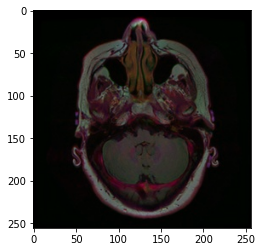

In [ ]:
img_ = cv2.imread(df3["img_path"][0])
plt.imshow(img_)

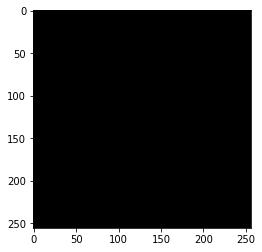

In [ ]:
img_ = cv2.imread(df3["mask_path"][0])
plt.imshow(img_)

In [ ]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(df3, test_size = 0.10)

In [ ]:
train_df

,patient_id,img_path,mask_path
1782,TCGA_DU_5854_19951104,brain_jpg/TCGA_DU_5854_19951104_14.jpg,brain_jpg/TCGA_DU_5854_19951104_14_mask.jpg
3406,TCGA_DU_6408_19860521,brain_jpg/TCGA_DU_6408_19860521_48.jpg,brain_jpg/TCGA_DU_6408_19860521_48_mask.jpg
3275,TCGA_DU_5874_19950510,brain_jpg/TCGA_DU_5874_19950510_23.jpg,brain_jpg/TCGA_DU_5874_19950510_23_mask.jpg
2803,TCGA_CS_4944_20010208,brain_jpg/TCGA_CS_4944_20010208_18.jpg,brain_jpg/TCGA_CS_4944_20010208_18_mask.jpg
1113,TCGA_HT_7877_19980917,brain_jpg/TCGA_HT_7877_19980917_2.jpg,brain_jpg/TCGA_HT_7877_19980917_2_mask.jpg
...,...,...,...
3378,TCGA_DU_A5TU_19980312,brain_jpg/TCGA_DU_A5TU_19980312_17.jpg,brain_jpg/TCGA_DU_A5TU_19980312_17_mask.jpg
2135,TCGA_DU_A5TT_19980318,brain_jpg/TCGA_DU_A5TT_19980318_33.jpg,brain_jpg/TCGA_DU_A5TT_19980318_33_mask.jpg
2705,TCGA_DU_7299_19910417,brain_jpg/TCGA_DU_7299_19910417_22.jpg,brain_jpg/TCGA_DU_7299_19910417_22_mask.jpg
1034,TCGA_DU_6407_19860514,brain_jpg/TCGA_DU_6407_19860514_26.jpg,brain_jpg/TCGA_DU_6407_19860514_26_mask.jpg


In [ ]:
### I took the preprocess codes from a homework notebook that I have completed in the CNN Course by Andrew NG. 

image_list = train_df["img_path"]
mask_list = train_df["mask_path"]

In [ ]:
image_list_ds = tf.data.Dataset.list_files(image_list, shuffle = False)
mask_list_ds = tf.data.Dataset.list_files(mask_list, shuffle = False)

In [ ]:
image_filenames = tf.constant(image_list)
mask_filenames = tf.constant(mask_list)

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((image_filenames, mask_filenames))

In [ ]:
def process_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=3)
    mask = tf.math.reduce_max(mask, axis=-1, keepdims=True)
    return img, mask

def preprocess(image, mask):
    input_image = tf.image.resize(image, (96, 128), method='nearest')
    input_mask = tf.image.resize(mask, (96, 128), method='nearest')

    return input_image, input_mask

image_ds = dataset.map(process_path)
processed_image_ds = image_ds.map(preprocess)

In [ ]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

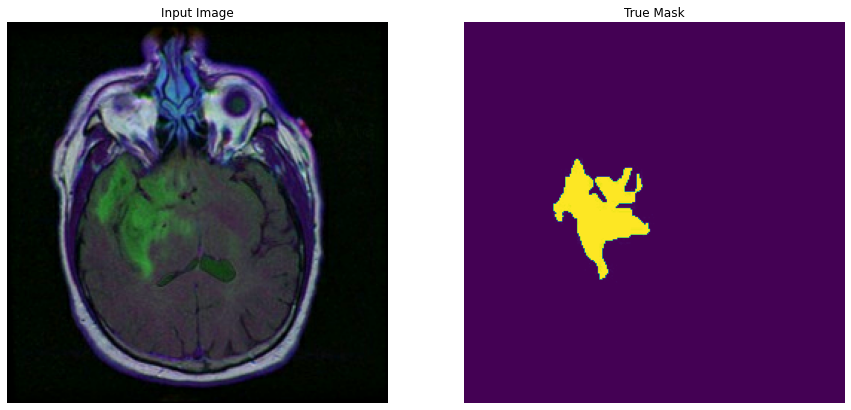

In [ ]:
for image, mask in image_ds.take(14):
    sample_image, sample_mask = image, mask
display([sample_image, sample_mask])

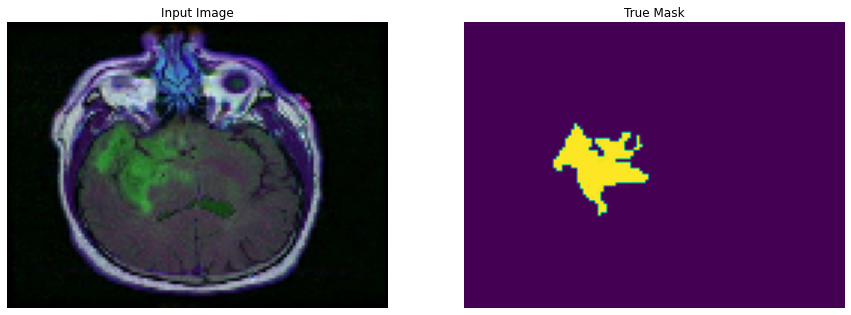

In [ ]:
for image, mask in processed_image_ds.take(14):
    sample_image, sample_mask = image, mask
display([sample_image, sample_mask])

In [ ]:
EPOCHS = 1
VAL_SUBSPLITS = 5
BUFFER_SIZE = 500
BATCH_SIZE = 32
processed_image_ds.batch(BATCH_SIZE)
train_dataset = processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(processed_image_ds.element_spec)
model_history = unet1.fit(train_dataset, epochs=EPOCHS)

(TensorSpec(shape=(96, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(96, 128, 1), dtype=tf.uint8, name=None))
111/111 [==============================] - 46s 398ms/step - loss: nan - accuracy: 0.9884


In [ ]:
sample_image = tf.reshape(sample_image, (1,96,128,3))

In [ ]:
sample_image

<tf.Tensor: shape=(1, 96, 128, 3), dtype=float32, numpy=
array([[[[0.        , 0.00392157, 0.        ],
         [0.        , 0.00392157, 0.        ],
         [0.        , 0.00784314, 0.00392157],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],

        [[0.        , 0.00392157, 0.        ],
         [0.        , 0.00392157, 0.        ],
         [0.        , 0.00784314, 0.00392157],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],

        [[0.        , 0.00392157, 0.        ],
         [0.        , 0.00392157, 0.        ],
         [0.        , 0.00784314, 0.00392157],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],

        ...,

        [[0.        , 0.        , 0

In [ ]:
unet1.layers[1](sample_image)

<tf.Tensor: shape=(1, 96, 128, 32), dtype=float32, numpy=
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        ...,

        [[nan, nan, nan, ..., nan, nan, nan],
      

In [ ]:
### It did not work since my label shape and loss functions do not fit. I will try semantic segmentation (binary classification of pixels.) with (96,128,1) output shape.

In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

In [ ]:
image_list = train_df["img_path"]
mask_list = train_df["mask_path"]

In [ ]:
image_list_ds = tf.data.Dataset.list_files(image_list, shuffle = False)
mask_list_ds = tf.data.Dataset.list_files(mask_list, shuffle = False)

In [ ]:
image_filenames = tf.constant(image_list)
mask_filenames = tf.constant(mask_list)

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((image_filenames, mask_filenames))

In [ ]:
def process_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=3)
    mask = tf.math.reduce_max(mask, axis=-1, keepdims=True)
    bool_vector = mask > 0
    mask = tf.cast(bool_vector, tf.float32)
    return img, mask

def preprocess(image, mask):
    input_image = tf.image.resize(image, (96, 128), method='nearest')
    input_mask = tf.image.resize(mask, (96, 128), method='nearest')

    return input_image, input_mask

image_ds = dataset.map(process_path)
processed_image_ds = image_ds.map(preprocess)

In [ ]:
def unet_model(input_size = (256,256,3), n_filters = 32):

  inputs = tfl.Input(input_size)


  conv_block_1 = conv_block(inputs,
                            n_filters)
  
  conv_block_2 = conv_block(conv_block_1[0],
                            n_filters * 2)
  
  conv_block_3 = conv_block(conv_block_2[0],
                            n_filters * 4)
  
  conv_block_4 = conv_block(conv_block_3[0],
                            n_filters * 8,
                            dropout_prob = 0.3)

  conv_block_5 = conv_block(conv_block_4[0],
                            n_filters * 16,
                            dropout_prob = 0.3,
                            max_pooling = False)
  
  up_block_4 = upsample_block(conv_block_5[0],
                              conv_block_4[1],
                              n_filters * 8)
   
  up_block_3 = upsample_block(up_block_4,
                              conv_block_3[1],
                              n_filters * 4) 
  
  up_block_2 = upsample_block(up_block_3,
                              conv_block_2[1],
                              n_filters * 2)
  
  up_block_1 = upsample_block(up_block_2,
                              conv_block_1[1],
                              n_filters )
  
  conv10 = tfl.Conv2D(n_filters,
                     3,
                     activation = "relu",
                     padding = "same",
                     kernel_initializer = "he_normal")(up_block_1)

  conv11 = tfl.Conv2D(filters = 1,
                      kernel_size = 1,
                      activation = "sigmoid",
                      padding = "same")(conv10)

  model = tf.keras.Model(inputs = inputs, outputs = conv11)

  return model

In [ ]:
img_height = 96
img_width = 128
num_channels = 3

unet_binary = unet_model((img_height, img_width, num_channels))

In [ ]:
unet_binary.compile(optimizer='adam',
              loss="BinaryCrossentropy",
              metrics=['accuracy'])

In [ ]:
EPOCHS = 10
VAL_SUBSPLITS = 5
BUFFER_SIZE = 500
BATCH_SIZE = 32
processed_image_ds.batch(BATCH_SIZE)
train_dataset = processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(processed_image_ds.element_spec)
model_history = unet_binary.fit(train_dataset, epochs=EPOCHS)

(TensorSpec(shape=(96, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(96, 128, 1), dtype=tf.float32, name=None))
Epoch 1/10
111/111 [==============================] - 48s 381ms/step - loss: 0.0817 - accuracy: 0.9834
Epoch 2/10
111/111 [==============================] - 34s 302ms/step - loss: 0.0281 - accuracy: 0.9899
Epoch 3/10
111/111 [==============================] - 33s 300ms/step - loss: 0.0226 - accuracy: 0.9929
Epoch 4/10
111/111 [==============================] - 33s 299ms/step - loss: 0.0190 - accuracy: 0.9939
Epoch 5/10
111/111 [==============================] - 33s 299ms/step - loss: 0.0178 - accuracy: 0.9940
Epoch 6/10
111/111 [==============================] - 33s 299ms/step - loss: 0.0150 - accuracy: 0.9946
Epoch 7/10
111/111 [==============================] - 33s 299ms/step - loss: 0.0121 - accuracy: 0.9955
Epoch 8/10
111/111 [==============================] - 33s 299ms/step - loss: 0.0100 - accuracy: 0.9962
Epoch 9/10
111/111 [==============================] -

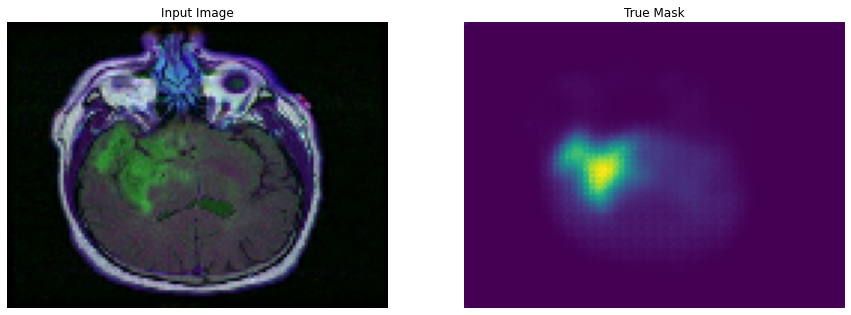

In [ ]:
display([sample_image, predicted_mask]) #(It was with 1 Epoch training)

In [ ]:
def predict_and_display(model, sample_image, sample_mask):

  predicted_mask = model.predict(tf.reshape(sample_image, shape = (1, 96, 128, 3)))
  predicted_mask = tf.reshape(predicted_mask, (96,128,1))
  display([sample_image, sample_mask, predicted_mask])

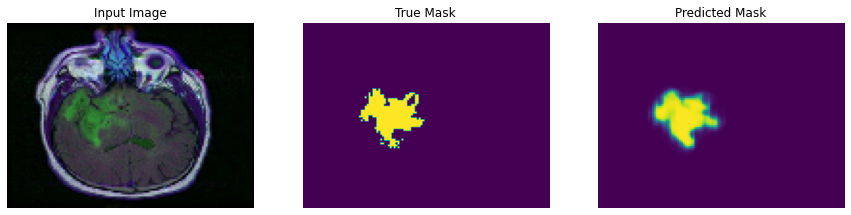

In [ ]:
predict_and_display(unet_binary, sample_image, sample_mask)

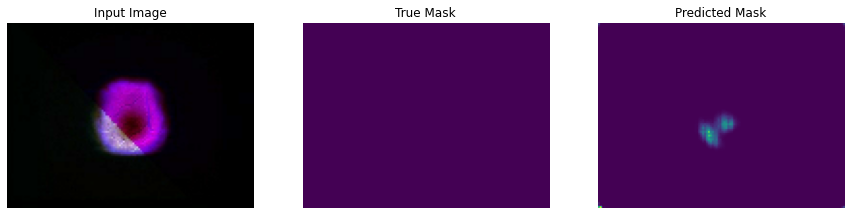

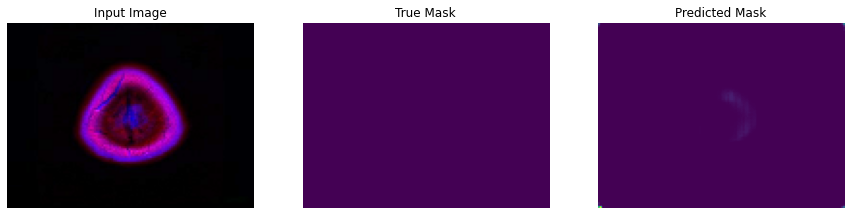

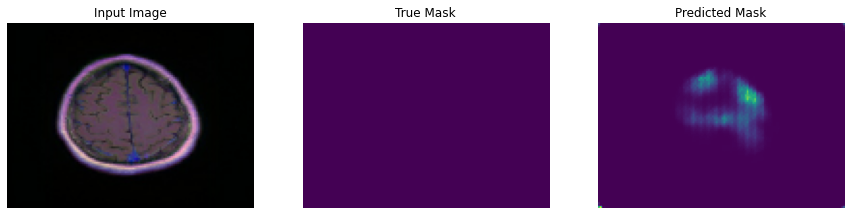

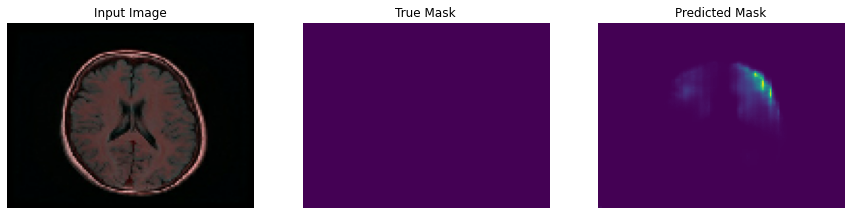

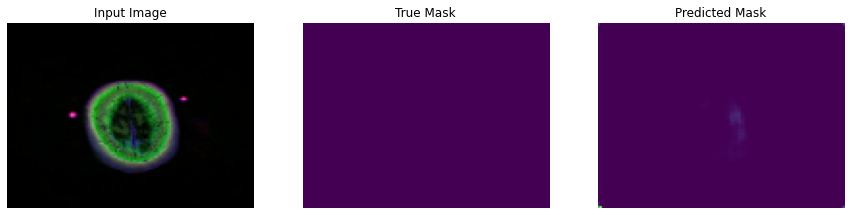

...

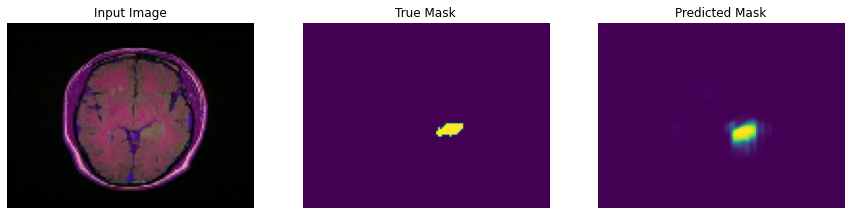

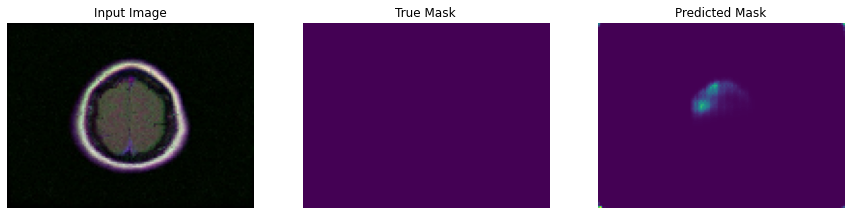

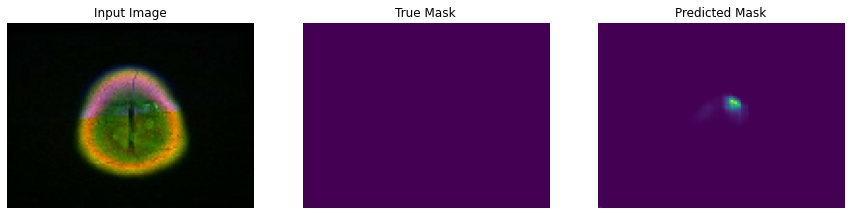

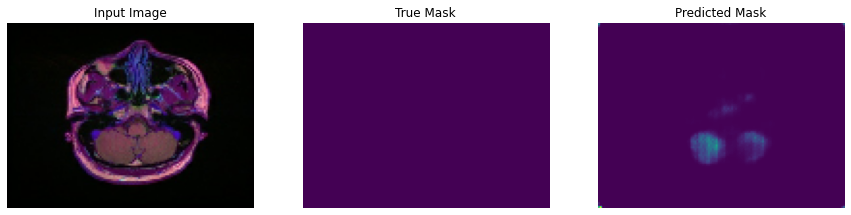

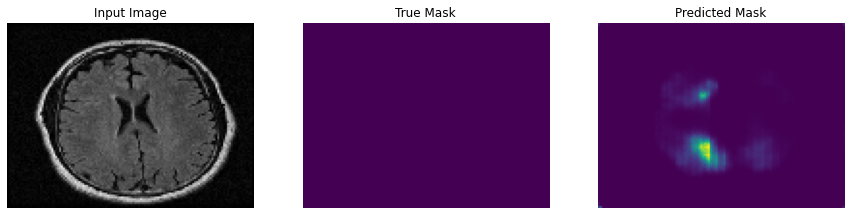

In [ ]:
for image, mask in processed_image_ds.take(20):
    sample_image, sample_mask = image, mask
    predict_and_display(unet_binary, sample_image, sample_mask)

In [ ]:
### I trained the model with basic binary crossentropy. However, basic binary crossentropy is not convenient for these tasks because of...
### ...unbalanced data and significance of false positives.
### Now, I will try another loss functions developed for medical semantic segmentation.

In [ ]:
### Thanks to "Abraham, Nabila and Khan, Naimul Mefraz"
### The github page of the loss functions: "https://github.com/nabsabraham/focal-tversky-unet"


from keras.losses import binary_crossentropy
import keras.backend as K
import tensorflow as tf 

epsilon = 1e-5
smooth = 1

def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

def confusion(y_true, y_pred):
    smooth=1
    y_pred_pos = K.clip(y_pred, 0, 1)
    y_pred_neg = 1 - y_pred_pos
    y_pos = K.clip(y_true, 0, 1)
    y_neg = 1 - y_pos
    tp = K.sum(y_pos * y_pred_pos)
    fp = K.sum(y_neg * y_pred_pos)
    fn = K.sum(y_pos * y_pred_neg) 
    prec = (tp + smooth)/(tp+fp+smooth)
    recall = (tp+smooth)/(tp+fn+smooth)
    return prec, recall

def tp(y_true, y_pred):
    smooth = 1
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pos = K.round(K.clip(y_true, 0, 1))
    tp = (K.sum(y_pos * y_pred_pos) + smooth)/ (K.sum(y_pos) + smooth) 
    return tp 

def tn(y_true, y_pred):
    smooth = 1
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos
    y_pos = K.round(K.clip(y_true, 0, 1))
    y_neg = 1 - y_pos 
    tn = (K.sum(y_neg * y_pred_neg) + smooth) / (K.sum(y_neg) + smooth )
    return tn 

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [ ]:
img_height = 96
img_width = 128
num_channels = 3

unet_binary = unet_model((img_height, img_width, num_channels))

In [ ]:
unet_binary.compile(optimizer = tf.keras.optimizers.Adam(),
                    loss = tversky_loss,
                    metrics = ["accuracy"])

In [ ]:
EPOCHS = 10
VAL_SUBSPLITS = 5
BUFFER_SIZE = 500
BATCH_SIZE = 32
processed_image_ds.batch(BATCH_SIZE)
train_dataset = processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(processed_image_ds.element_spec)
model_history = unet_binary.fit(train_dataset, epochs=EPOCHS)

(TensorSpec(shape=(96, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(96, 128, 1), dtype=tf.float32, name=None))
Epoch 1/10
111/111 [==============================] - 23s 183ms/step - loss: 0.6036 - accuracy: 0.8950
Epoch 2/10
111/111 [==============================] - 14s 130ms/step - loss: 0.4764 - accuracy: 0.9847
Epoch 3/10
111/111 [==============================] - 15s 132ms/step - loss: 0.4683 - accuracy: 0.9831
Epoch 4/10
111/111 [==============================] - 15s 131ms/step - loss: 0.4157 - accuracy: 0.9868
Epoch 5/10
111/111 [==============================] - 15s 131ms/step - loss: 0.4181 - accuracy: 0.9875
Epoch 6/10
111/111 [==============================] - 15s 132ms/step - loss: 0.3820 - accuracy: 0.9896
Epoch 7/10
111/111 [==============================] - 15s 132ms/step - loss: 0.3520 - accuracy: 0.9904
Epoch 8/10
111/111 [==============================] - 15s 133ms/step - loss: 0.3412 - accuracy: 0.9908
Epoch 9/10
111/111 [==============================] -

In [ ]:
def predict_and_display(model, sample_image, sample_mask):

  predicted_mask = model.predict(tf.reshape(sample_image, shape = (1, 96, 128, 3)))
  predicted_mask = tf.reshape(predicted_mask, (96,128,1))
  display([sample_image, sample_mask, predicted_mask])

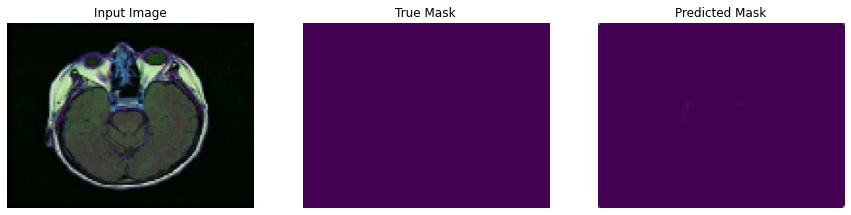

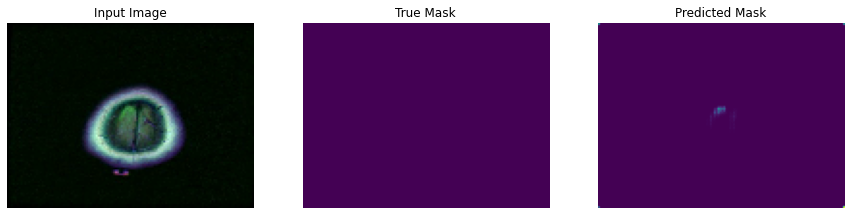

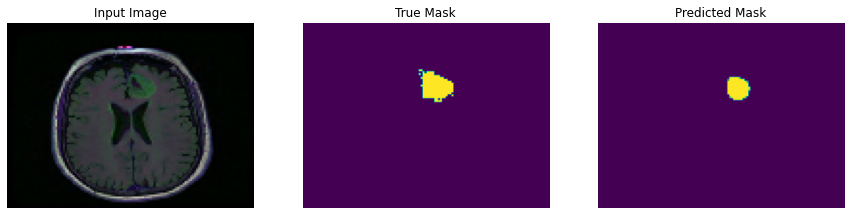

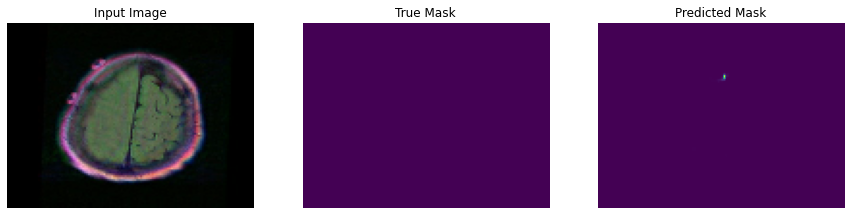

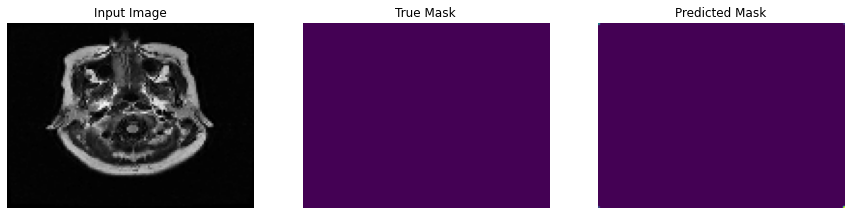

...

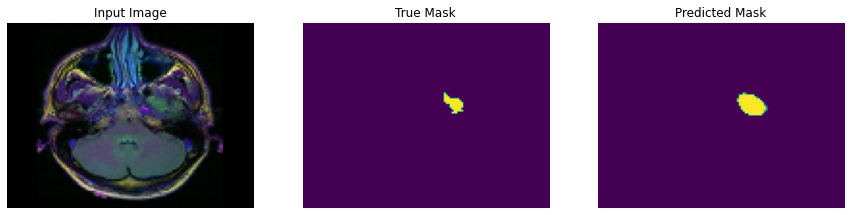

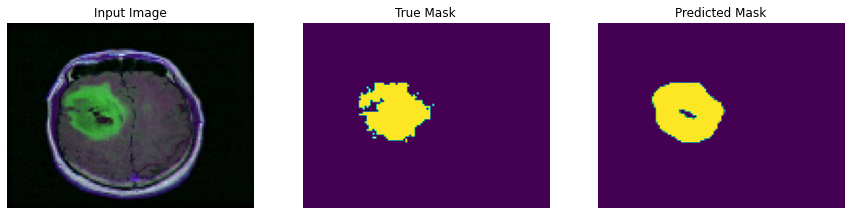

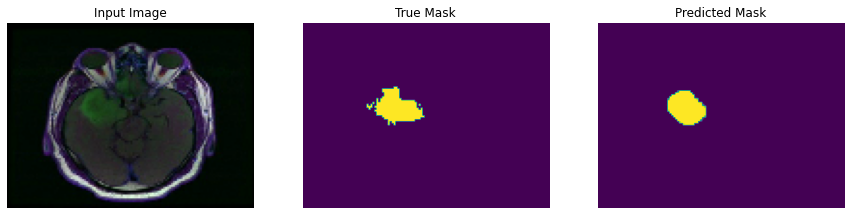

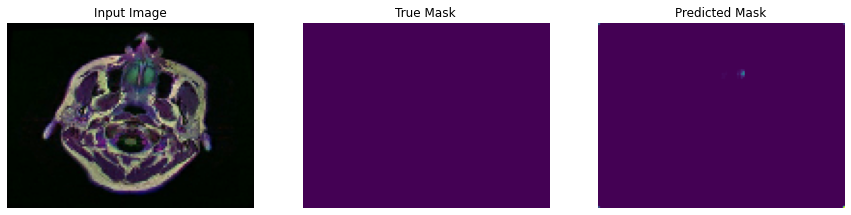

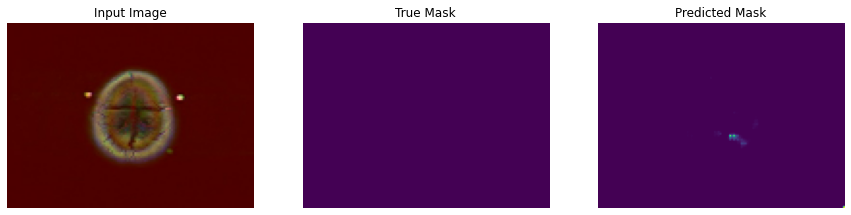

In [ ]:
for image, mask in processed_image_ds.take(20):
    sample_image, sample_mask = image, mask
    predict_and_display(unet_binary, sample_image, sample_mask)

In [ ]:
### Not so good, let's try focal_tversky loss and some callbacks. Moreover, I will train the model with more epochs.

In [ ]:
img_height = 96
img_width = 128
num_channels = 3

unet_binary = unet_model((img_height, img_width, num_channels))

In [ ]:
unet_binary.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1),
                    loss = focal_tversky,
                    metrics = ["accuracy"])

### I reached these hyperparameter values from one notebook on the Kaggle webpage of the dataset, they seem reasonable.

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau


reduce_lr = ReduceLROnPlateau(mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )

In [ ]:
EPOCHS = 100
VAL_SUBSPLITS = 5
BUFFER_SIZE = 500
BATCH_SIZE = 32
processed_image_ds.batch(BATCH_SIZE)
train_dataset = processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(processed_image_ds.element_spec)
model_history = unet_binary.fit(train_dataset, epochs=EPOCHS)

(TensorSpec(shape=(96, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(96, 128, 1), dtype=tf.float32, name=None))
Epoch 1/100
111/111 [==============================] - 25s 188ms/step - loss: 0.9629 - accuracy: 0.3671
Epoch 2/100
111/111 [==============================] - 15s 131ms/step - loss: 0.9265 - accuracy: 0.7607
Epoch 3/100
111/111 [==============================] - 15s 132ms/step - loss: 0.8064 - accuracy: 0.9699
Epoch 4/100
111/111 [==============================] - 15s 133ms/step - loss: 0.6538 - accuracy: 0.9800
Epoch 5/100
111/111 [==============================] - 15s 133ms/step - loss: 0.5835 - accuracy: 0.9839
Epoch 6/100
111/111 [==============================] - 15s 133ms/step - loss: 0.5207 - accuracy: 0.9879
Epoch 7/100
111/111 [==============================] - 15s 133ms/step - loss: 0.5178 - accuracy: 0.9877
Epoch 8/100
111/111 [==============================] - 15s 135ms/step - loss: 0.4930 - accuracy: 0.9886
Epoch 9/100
111/111 [========================

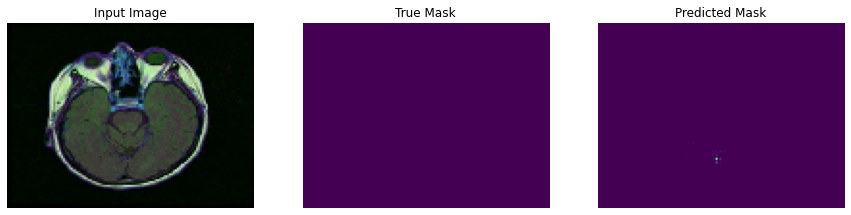

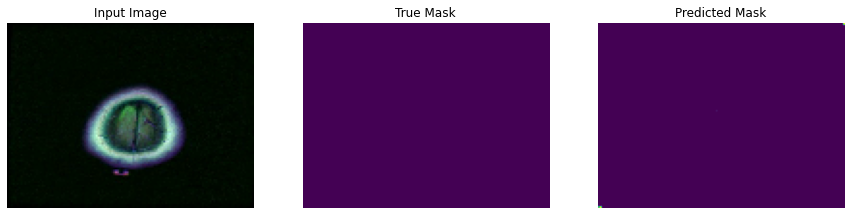

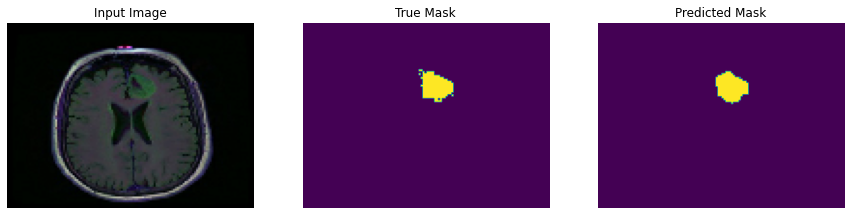

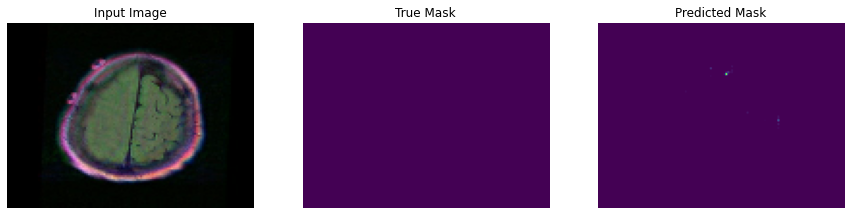

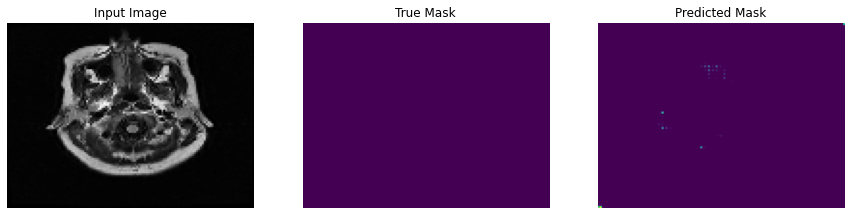

...

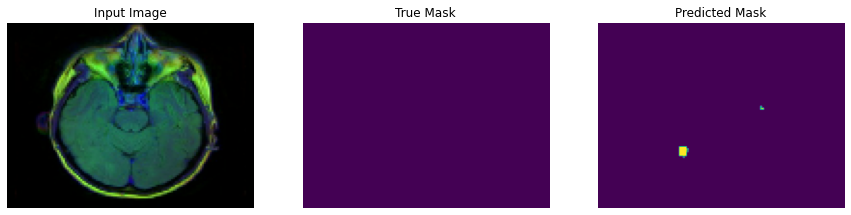

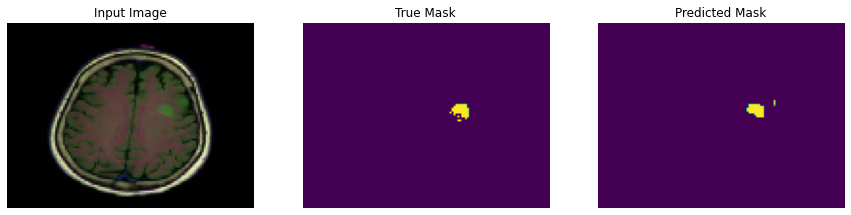

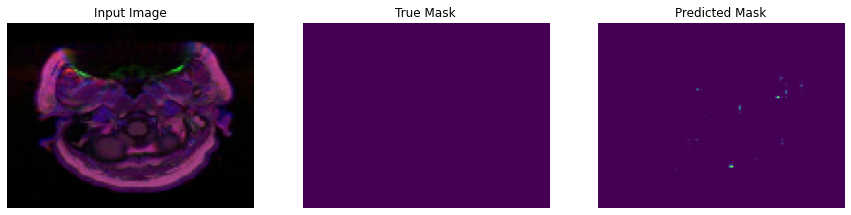

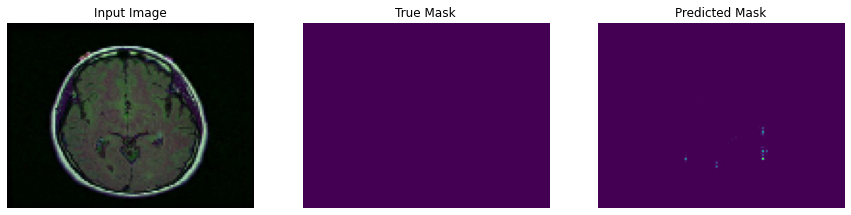

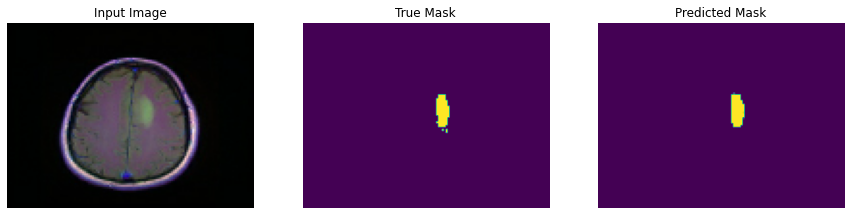

In [ ]:
for image, mask in processed_image_ds.take(100):
    sample_image, sample_mask = image, mask
    predict_and_display(unet_binary, sample_image, sample_mask)

In [ ]:
### It did work!
### We can improve the model by using data augmentation, early stopping, error analysis. But I will leave this project here for now.